In [1]:
import pandas as pd
import numpy as np
import datetime
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv(r"C:\Users\basil\OneDrive\Escritorio\Ironhack\labs\lab-revisiting-machine-learning\learningSet.csv")

In [3]:
data.shape

(95412, 481)

In [4]:
data

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,TARGET_D,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,CLUSTER2,GEOCODE2
0,8901,GRI,0,IL,61081,,,3712,0,,...,0.0,0,L,4,E,X,X,X,39.0,C
1,9401,BOA,1,CA,91326,,,5202,0,,...,0.0,0,L,2,G,X,X,X,1.0,A
2,9001,AMH,1,NC,27017,,,0,0,,...,0.0,1,L,4,E,X,X,X,60.0,C
3,8701,BRY,0,CA,95953,,,2801,0,,...,0.0,1,L,4,E,X,X,X,41.0,C
4,8601,,0,FL,33176,,,2001,0,X,...,0.0,1,L,2,F,X,X,X,26.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,9601,ASE,1,AK,99504,,,0,0,,...,0.0,0,L,1,G,X,X,X,12.0,C
95408,9601,DCD,1,TX,77379,,,5001,0,,...,0.0,1,L,1,F,X,X,X,2.0,A
95409,9501,MBC,1,MI,48910,,,3801,0,,...,0.0,1,L,3,E,X,X,X,34.0,B
95410,8601,PRV,0,CA,91320,,,4005,0,X,...,18.0,1,L,4,F,X,X,X,11.0,A


In [5]:
data.describe()

,ODATEDW,TCODE,DOB,AGE,NUMCHLD,INCOME,WEALTH1,HIT,MBCRAFT,MBGARDEN,...,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,TARGET_B,TARGET_D,HPHONE_D,RFA_2F,CLUSTER2
count,95412.000000,95412.000000,95412.000000,71747.000000,12386.000000,74126.000000,50680.000000,95412.000000,42558.000000,42558.000000,...,95412.000000,85439.000000,85439.000000,95412.000000,95412.000000,95412.000000,95412.000000,95412.000000,95412.000000,95280.000000
mean,9141.363256,54.223117,2723.602933,61.611649,1.527773,3.886248,5.345699,3.321438,0.152075,0.059166,...,9135.651648,9151.022917,8.093739,13.347786,95778.176959,0.050759,0.793073,0.500618,1.910053,31.533711
std,343.454752,953.844476,2132.241295,16.664199,0.806861,1.854960,2.742490,9.306899,0.470023,0.262078,...,320.394019,294.257260,8.213242,10.769997,55284.596094,0.219506,4.429725,0.500002,1.072749,18.764614
min,8306.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,7211.000000,0.000000,1.285714,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,8801.000000,0.000000,201.000000,48.000000,1.000000,2.000000,3.000000,0.000000,0.000000,0.000000,...,8810.000000,8903.000000,4.000000,8.384615,47910.750000,0.000000,0.000000,0.000000,1.000000,15.000000
50%,9201.000000,1.000000,2610.000000,62.000000,1.000000,4.000000,6.000000,0.000000,0.000000,0.000000,...,9201.000000,9204.000000,6.000000,11.636364,95681.500000,0.000000,0.000000,1.000000,2.000000,32.000000
75%,9501.000000,2.000000,4601.000000,75.000000,2.000000,5.000000,8.000000,3.000000,0.000000,0.000000,...,9409.000000,9409.000000,11.000000,15.477955,143643.500000,0.000000,0.000000,1.000000,3.000000,49.000000
max,9701.000000,72002.000000,9710.000000,98.000000,7.000000,7.000000,9.000000,241.000000,6.000000,4.000000,...,9603.000000,9702.000000,1088.000000,1000.000000,191779.000000,1.000000,200.000000,1.000000,4.000000,62.000000


In [6]:
# Identify categorical columns
categorical = data.select_dtypes(include=['object']).columns

# Print out the list of categorical columns
print(categorical)

Index(['OSOURCE', 'STATE', 'ZIP', 'MAILCODE', 'PVASTATE', 'NOEXCH', 'RECINHSE',
       'RECP3', 'RECPGVG', 'RECSWEEP', 'MDMAUD', 'DOMAIN', 'CLUSTER',
       'AGEFLAG', 'HOMEOWNR', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18',
       'GENDER', 'DATASRCE', 'SOLP3', 'SOLIH', 'MAJOR', 'GEOCODE', 'COLLECT1',
       'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO',
       'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER',
       'KIDSTUFF', 'CARDS', 'PLATES', 'LIFESRC', 'PEPSTRFL', 'RFA_2', 'RFA_3',
       'RFA_4', 'RFA_5', 'RFA_6', 'RFA_7', 'RFA_8', 'RFA_9', 'RFA_10',
       'RFA_11', 'RFA_12', 'RFA_13', 'RFA_14', 'RFA_15', 'RFA_16', 'RFA_17',
       'RFA_18', 'RFA_19', 'RFA_20', 'RFA_21', 'RFA_22', 'RFA_23', 'RFA_24',
       'RFA_2R', 'RFA_2A', 'MDMAUD_R', 'MDMAUD_F', 'MDMAUD_A', 'GEOCODE2'],
      dtype='object')


In [7]:
# Check for null values only in the categorical columns
null_values_categorical = data[categorical].isnull().sum()

# Print out the null values count for each categorical column
print(null_values_categorical)

OSOURCE       0
STATE         0
ZIP           0
MAILCODE      0
PVASTATE      0
           ... 
RFA_2A        0
MDMAUD_R      0
MDMAUD_F      0
MDMAUD_A      0
GEOCODE2    132
Length: 74, dtype: int64


In [8]:
# Define the variables to exclude
exclude_variables = ['OSOURCE', 'ZIP CODE']

# Create a new empty list called drop_list
drop_list = []

# Append variables to drop_list if they are in categorical columns and not in the exclude list
for col in categorical:
    if col not in exclude_variables:
        drop_list.append(col)

# Print out the columns to be dropped
print(drop_list)

['STATE', 'ZIP', 'MAILCODE', 'PVASTATE', 'NOEXCH', 'RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'MDMAUD', 'DOMAIN', 'CLUSTER', 'AGEFLAG', 'HOMEOWNR', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18', 'GENDER', 'DATASRCE', 'SOLP3', 'SOLIH', 'MAJOR', 'GEOCODE', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'LIFESRC', 'PEPSTRFL', 'RFA_2', 'RFA_3', 'RFA_4', 'RFA_5', 'RFA_6', 'RFA_7', 'RFA_8', 'RFA_9', 'RFA_10', 'RFA_11', 'RFA_12', 'RFA_13', 'RFA_14', 'RFA_15', 'RFA_16', 'RFA_17', 'RFA_18', 'RFA_19', 'RFA_20', 'RFA_21', 'RFA_22', 'RFA_23', 'RFA_24', 'RFA_2R', 'RFA_2A', 'MDMAUD_R', 'MDMAUD_F', 'MDMAUD_A', 'GEOCODE2']


In [9]:
# Calculate the percentage of null values for each categorical column
nulls_categorical = pd.DataFrame(null_values_categorical * 100 / len(data), columns=['percentage'])

# Sort the categorical columns by the percentage of null values in descending order
nulls_categorical = nulls_categorical.sort_values(by='percentage', ascending=False)

# Display the top 50 categorical columns with the highest percentage of null values
print(nulls_categorical.head(50))

          percentage
GEOCODE2    0.138347
RFA_12      0.000000
RFA_10      0.000000
RFA_9       0.000000
RFA_8       0.000000
RFA_7       0.000000
RFA_6       0.000000
RFA_5       0.000000
RFA_4       0.000000
RFA_3       0.000000
RFA_2       0.000000
PEPSTRFL    0.000000
LIFESRC     0.000000
PLATES      0.000000
CARDS       0.000000
KIDSTUFF    0.000000
WALKER      0.000000
RFA_11      0.000000
RFA_13      0.000000
STATE       0.000000
RFA_14      0.000000
MDMAUD_A    0.000000
MDMAUD_F    0.000000
MDMAUD_R    0.000000
RFA_2A      0.000000
RFA_2R      0.000000
RFA_24      0.000000
RFA_23      0.000000
RFA_22      0.000000
RFA_21      0.000000
RFA_20      0.000000
RFA_19      0.000000
RFA_18      0.000000
RFA_17      0.000000
RFA_16      0.000000
RFA_15      0.000000
BOATS       0.000000
OSOURCE     0.000000
FISHER      0.000000
CRAFTS      0.000000
CHILD07     0.000000
CHILD03     0.000000
HOMEOWNR    0.000000
AGEFLAG     0.000000
CLUSTER     0.000000
DOMAIN      0.000000
MDMAUD      0

In [10]:
# Check the shape of the dataframe after dropping columns
print("Shape of the dataframe after dropping columns:", data.shape)

Shape of the dataframe after dropping columns: (95412, 481)


In [11]:
data['GENDER'].value_counts()

GENDER
F    51277
M    39094
      2957
U     1715
J      365
C        2
A        2
Name: count, dtype: int64

In [12]:
data['GENDER'].value_counts()
data['GENDER'] = data['GENDER'].fillna('F')

In [13]:
# Replace all gender categories other than "M" and "F" with "other"
data['GENDER'] = data['GENDER'].apply(lambda x: 'other' if x not in ['M', 'F'] else x)

In [14]:
data['GENDER'].value_counts()

GENDER
F        51277
M        39094
other     5041
Name: count, dtype: int64

# lab Feature engineering

In [15]:
#select numerical columns
numerical = data.select_dtypes(include=['float64', 'int64'])

In [16]:
#check for nulls in numerical columns
numerical_nulls = numerical.isnull().sum()
print(numerical_nulls)

ODATEDW         0
TCODE           0
DOB             0
AGE         23665
NUMCHLD     83026
            ...  
TARGET_B        0
TARGET_D        0
HPHONE_D        0
RFA_2F          0
CLUSTER2      132
Length: 407, dtype: int64


In [17]:
# Calculate the median of the 'age' column
median_age = data['AGE'].median()

# Replace null values in the 'age' column with the median
data['AGE'].fillna(median_age, inplace=True)

In [18]:
data['AGE'].value_counts()

AGE
62.0    25136
50.0     1930
76.0     1885
72.0     1813
68.0     1809
        ...  
8.0         1
9.0         1
10.0        1
6.0         1
15.0        1
Name: count, Length: 96, dtype: int64

In [19]:
data['CLUSTER2'].value_counts()

CLUSTER2
13.0    3466
5.0     3154
57.0    2666
59.0    2653
15.0    2559
        ... 
30.0     647
46.0     644
29.0     569
40.0     369
6.0      211
Name: count, Length: 62, dtype: int64

In [20]:
data['NUMCHLD'].value_counts()

NUMCHLD
1.0    7792
2.0    3110
3.0    1101
4.0     316
5.0      59
6.0       7
7.0       1
Name: count, dtype: int64

In [21]:
data['GEOCODE2'].value_counts()

GEOCODE2
A    34484
B    28505
D    16580
C    15524
       187
Name: count, dtype: int64

In [22]:
# Replace all gender categories other than "M" and "F" with "other"
data['GEOCODE2'] = data['GEOCODE2'].apply(lambda x: 'E' if x not in ['A', 'B', 'C', 'D'] else x)

In [23]:
data['GEOCODE2'].value_counts()

GEOCODE2
A    34484
B    28505
D    16580
C    15524
E      319
Name: count, dtype: int64

In [24]:
data['WEALTH1'].value_counts()

WEALTH1
9.0    7585
8.0    6793
7.0    6198
6.0    5825
5.0    5280
4.0    4810
3.0    4237
2.0    4085
1.0    3454
0.0    2413
Name: count, dtype: int64

In [25]:
data['WEALTH1'].isnull().sum()

44732

In [26]:
data['WEALTH1'].value_counts()

WEALTH1
9.0    7585
8.0    6793
7.0    6198
6.0    5825
5.0    5280
4.0    4810
3.0    4237
2.0    4085
1.0    3454
0.0    2413
Name: count, dtype: int64

In [27]:
# Assuming 'data' is your DataFrame and 'WEALTH1' is the column you want to update
data['WEALTH1'].fillna(0.0, inplace=True)


In [28]:
data['WEALTH1'].isnull().sum()

0

In [29]:
data['DMA'].isnull().sum()

132

In [30]:
data['DMA'].value_counts()

DMA
803.0    7296
602.0    4632
807.0    3765
505.0    2839
819.0    2588
         ... 
569.0       1
554.0       1
584.0       1
552.0       1
516.0       1
Name: count, Length: 206, dtype: int64

In [31]:
# Calculate the median of the 'DMA' column
median_dma = data['DMA'].median()

# Replace null values in the 'DMA' column with the median
data['DMA'].fillna(median_dma, inplace=True)

In [32]:
data['DMA'].isnull().sum()

0

In [33]:
data['DMA'] = data['DMA'].astype(int)

In [34]:
data['DMA'].value_counts()

DMA
803    7296
602    4632
807    3765
505    2839
819    2588
       ... 
569       1
554       1
584       1
552       1
516       1
Name: count, Length: 206, dtype: int64

In [35]:
data['ADI'].isnull().sum()

132

In [36]:
data['ADI'].value_counts()

ADI
13.0     7296
51.0     4622
65.0     3765
57.0     2836
105.0    2617
         ... 
651.0       1
103.0       1
601.0       1
161.0       1
147.0       1
Name: count, Length: 204, dtype: int64

In [37]:
# Calculate the mean of the 'ADI' column
median_adi = data['ADI'].median()

# Replace null values in the 'ADI' column with the median
data['ADI'].fillna(median_adi, inplace=True)

In [38]:
data['ADI'] = data['ADI'].astype(int)


In [39]:
data['ADI'].value_counts()

ADI
13     7296
51     4622
65     3765
57     2836
105    2617
       ... 
651       1
103       1
601       1
161       1
147       1
Name: count, Length: 204, dtype: int64

# EDA

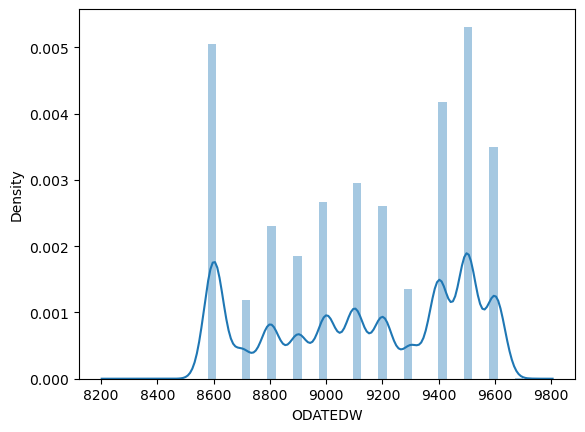

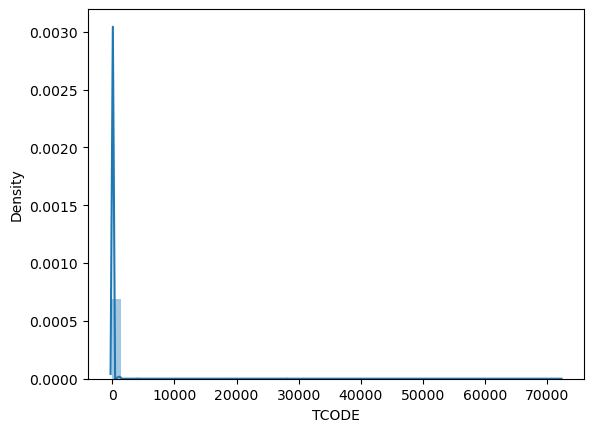

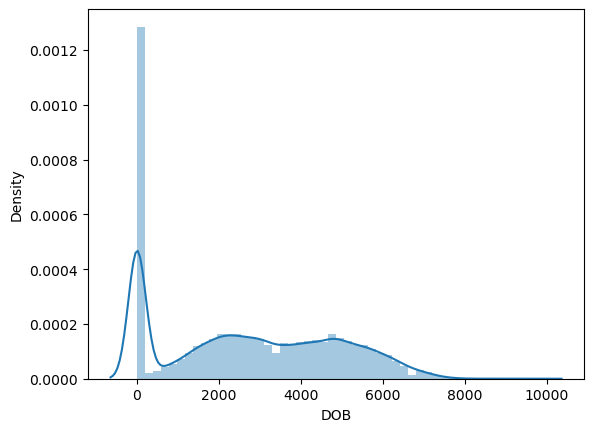

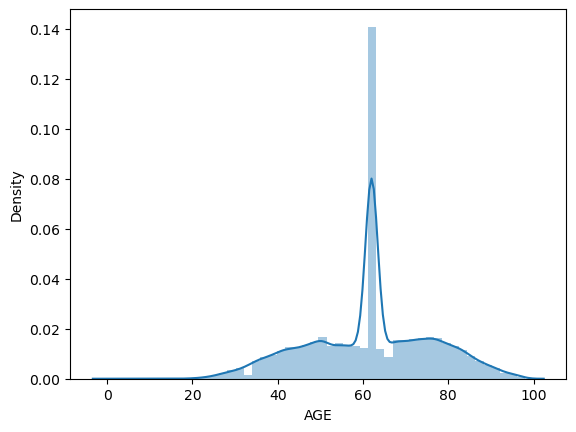

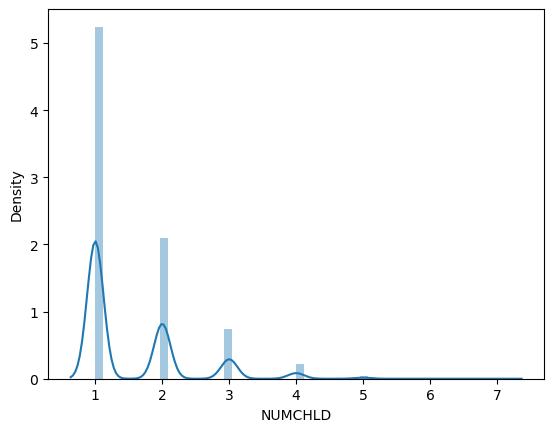

...

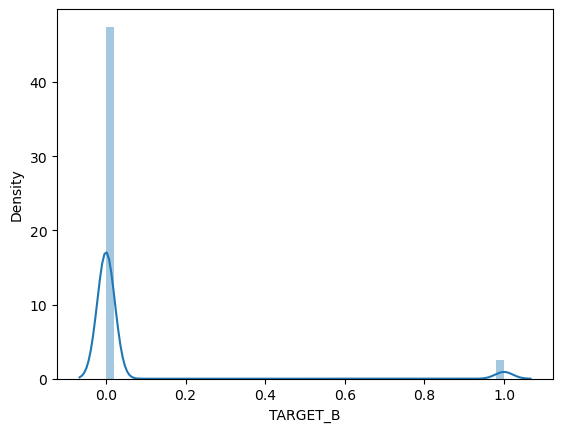

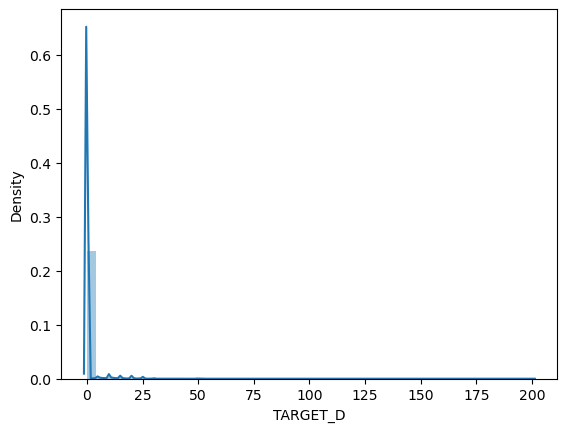

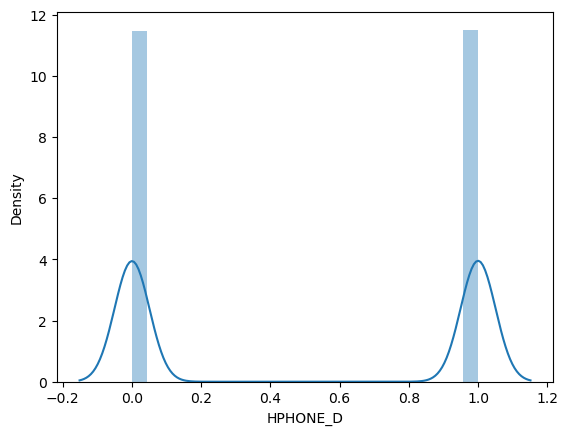

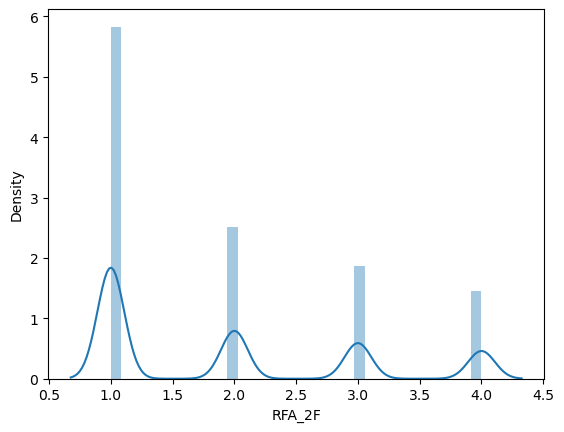

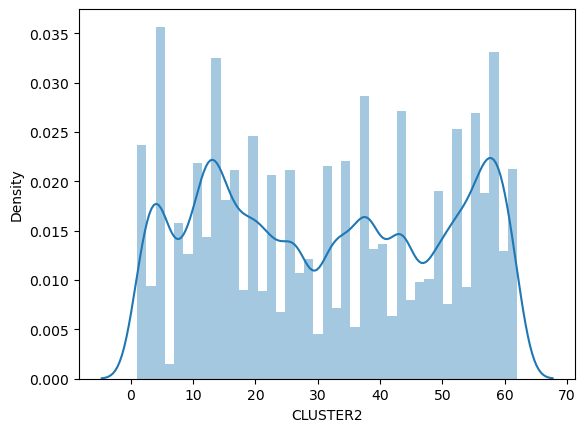

In [40]:
#plotting the numerical variables to check the distribution of each columns
for col in numerical.columns:
  sns.distplot(data[col])
  plt.show()

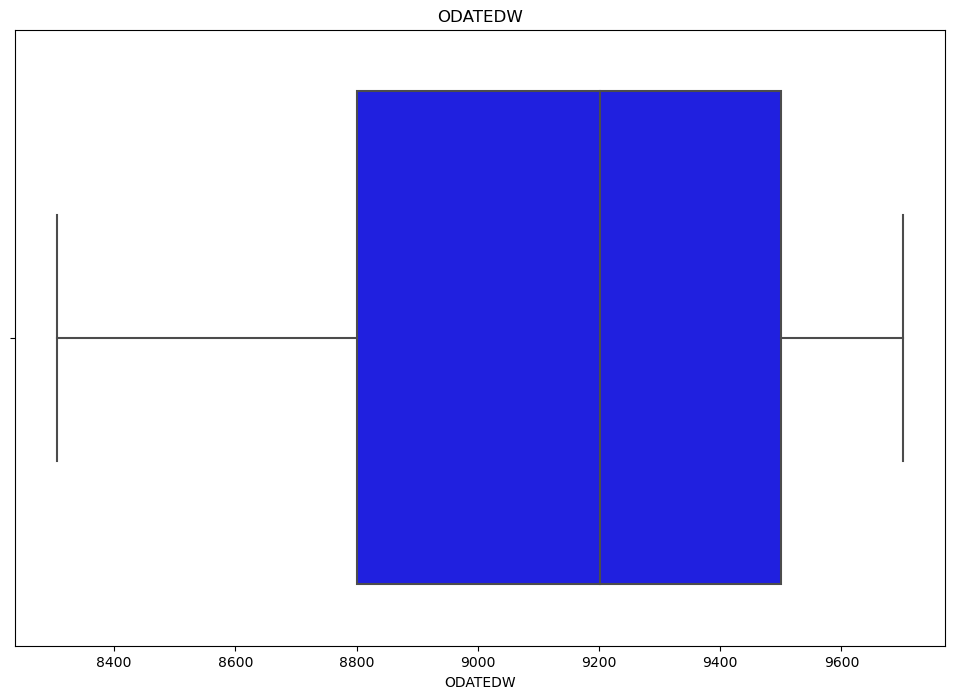

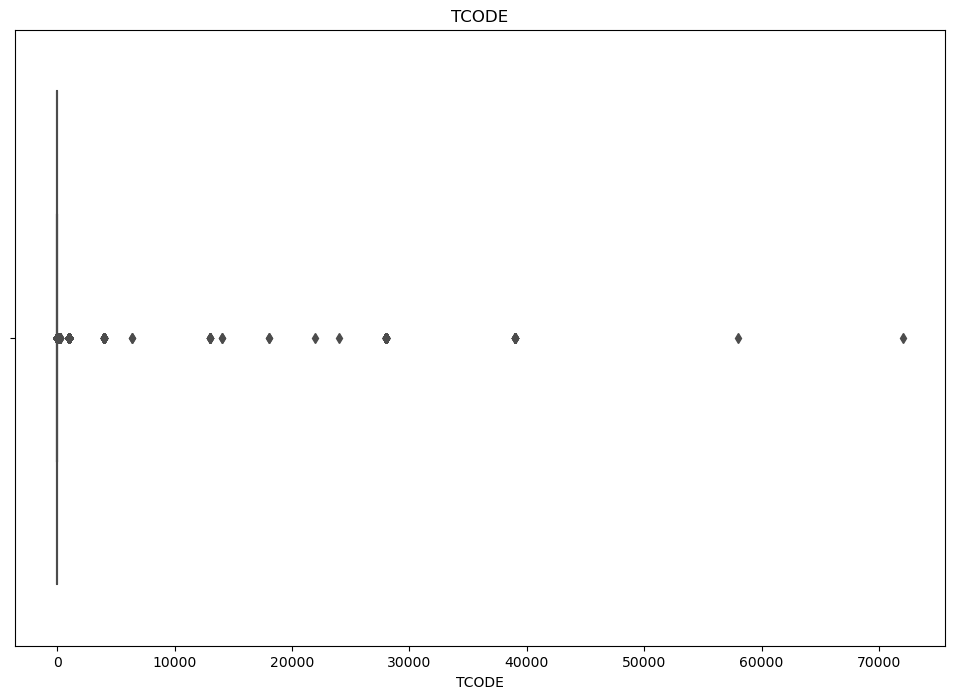

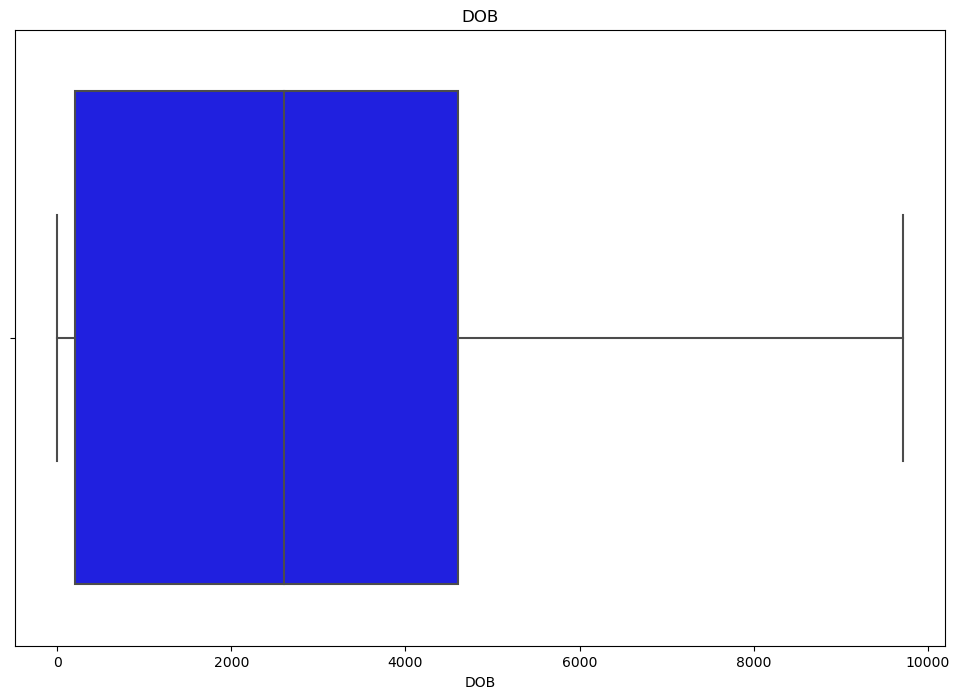

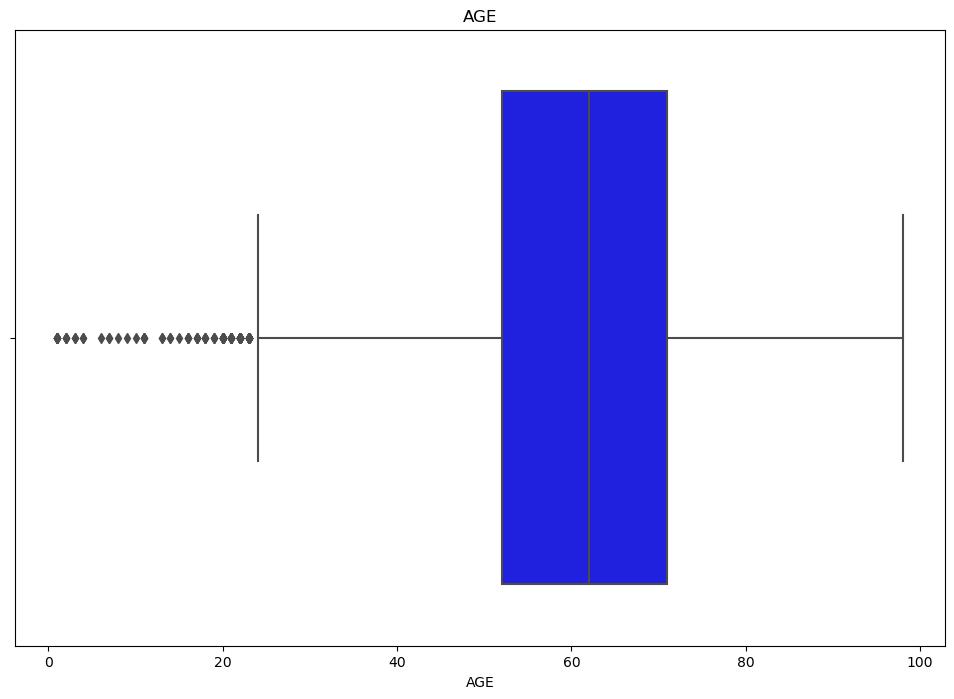

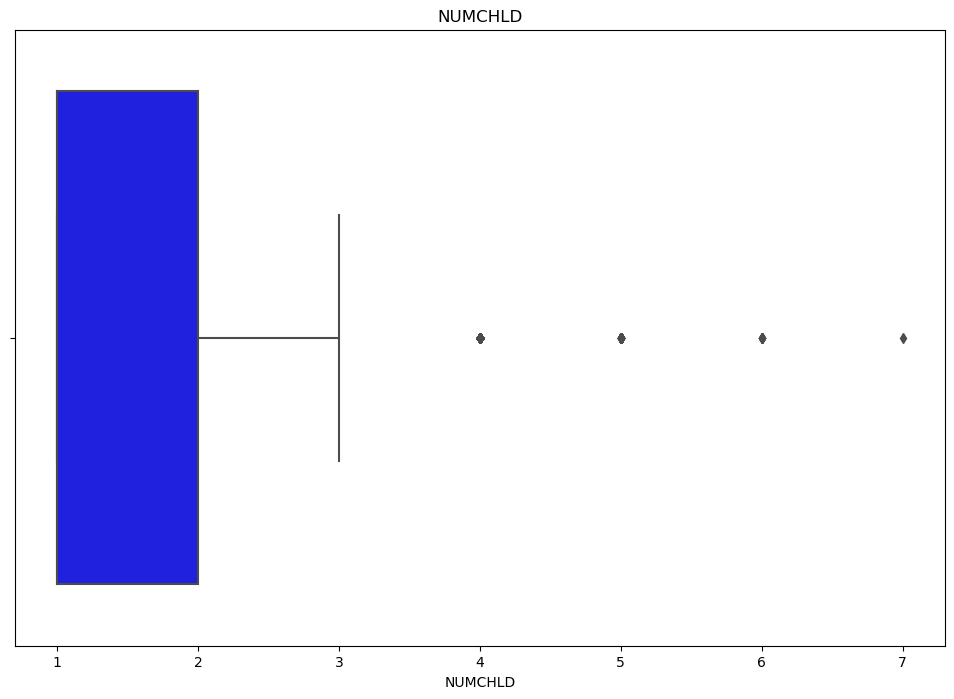

...

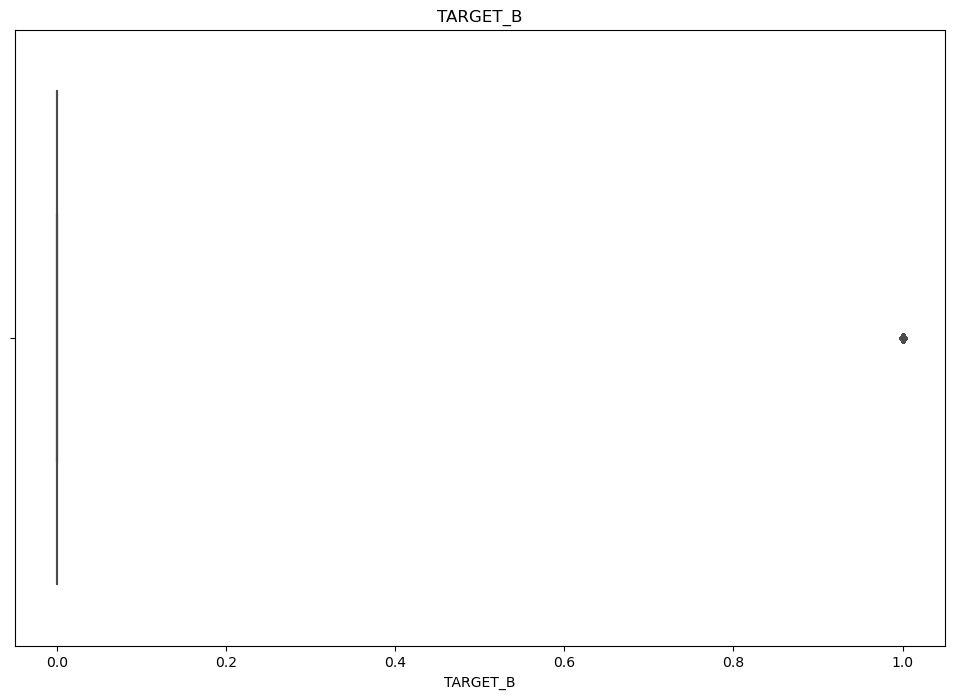

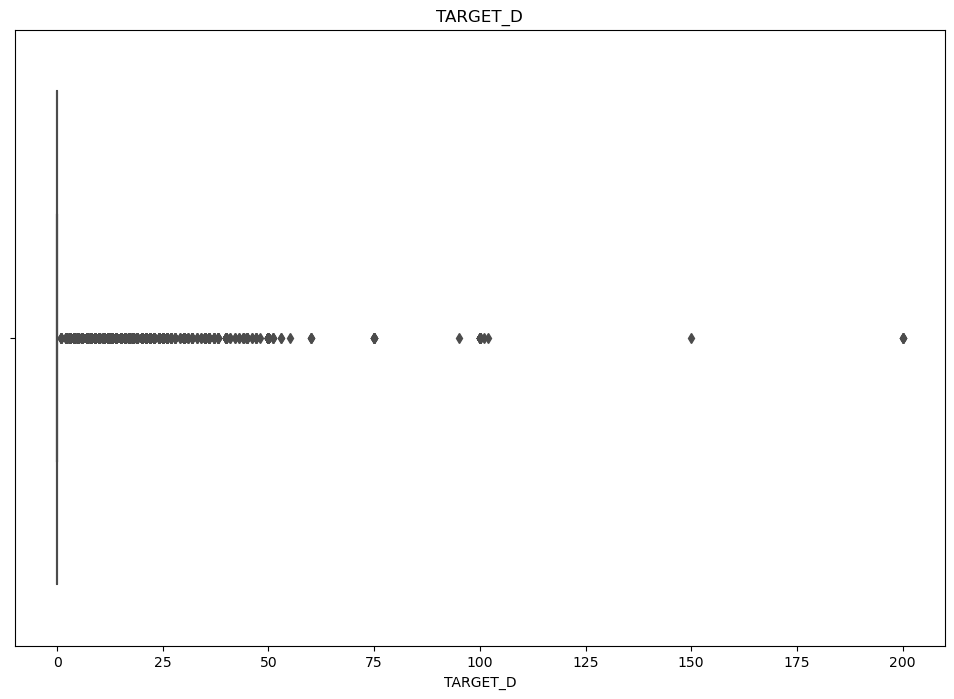

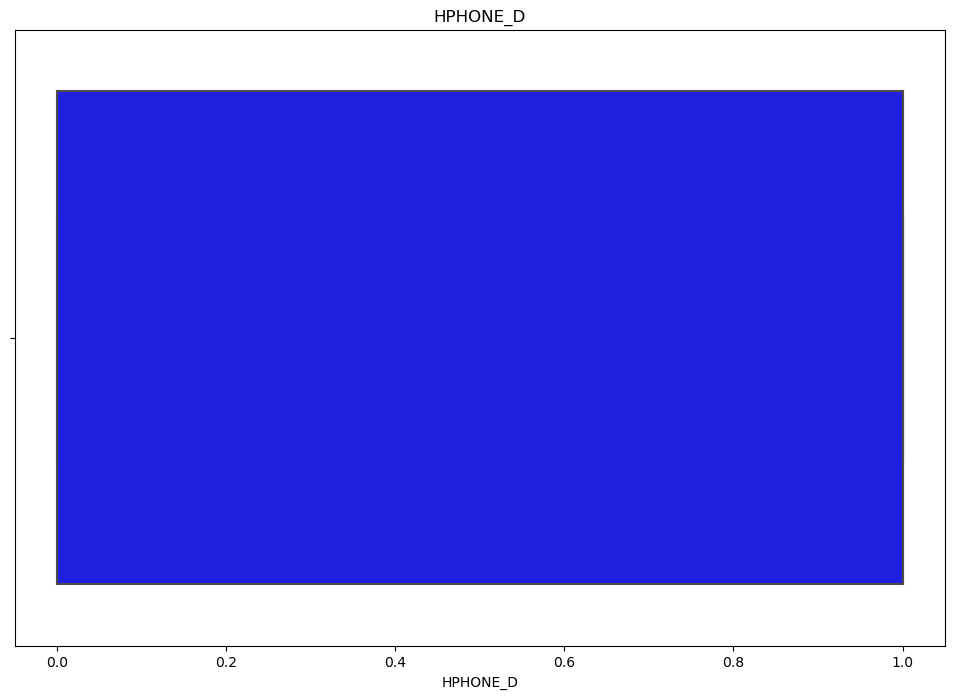

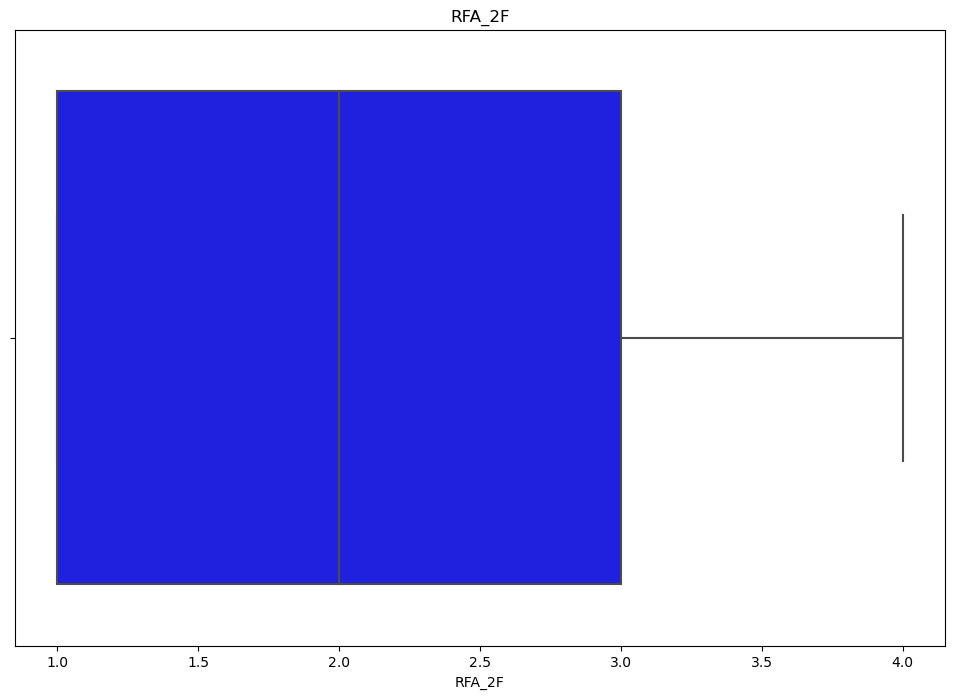

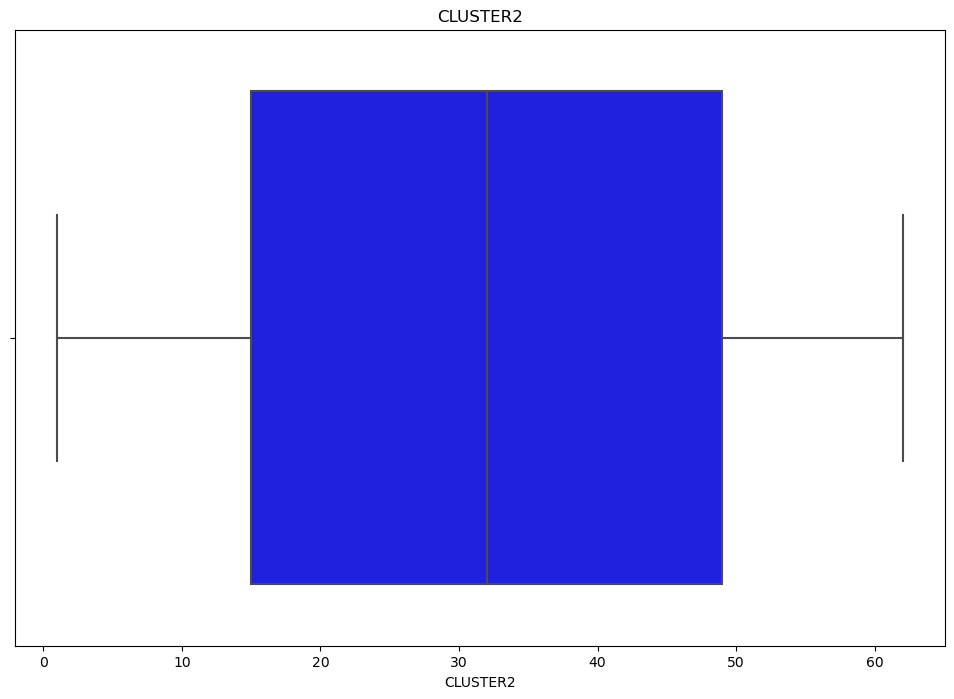

In [45]:
#check for outliers
for column in data.select_dtypes(include=['number']):
    plt.figure(figsize=(12, 8))
    sns.boxplot(x=data[column], color='blue')
    plt.title(column)
    plt.show()